In [2]:
import matplotlib.pyplot as plt
import numpy as np
from keras.models import *
from keras.layers import *
from keras.datasets import mnist
import os

In [3]:
OUT_DIR = './CNN_out'
img_shape = (28,28,1)
epochs = 100000
batch_size = 128
noise = 100
sample_interval = 100

In [4]:
(x_train, y_train), (_,_) = mnist.load_data()
# print(x_train.shape)
MY_NUMBER = 3 #숫자 3만 학습시키기
x_train = x_train[y_train == MY_NUMBER]
x_train = x_train/127.5 - 1
x_train = np.expand_dims(x_train, axis=3)
print(x_train.shape)

11490434/11490434 [==============================] - 0s 0us/step
(6131, 28, 28, 1)


In [5]:
generator = Sequential()
generator.add(Dense(256*7*7, input_dim=noise))
generator.add(Reshape((7, 7, 256)))
generator.add(Conv2DTranspose(128,kernel_size=3,strides=2, padding='same')) # conv 후 maxpool
generator.add(BatchNormalization()) #값이 커져서 발산하지 않도록 배치별로 한번씩 스켈링 해줌 (최소 최대 정규화)
generator.add(LeakyReLU(alpha=0.01))
generator.add(Conv2DTranspose(64,kernel_size=3,strides=1, padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(alpha=0.01))
generator.add(Conv2DTranspose(1,kernel_size=3,strides=2, padding='same'))
generator.add(Activation('tanh'))
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1266944   
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 14, 14, 128)      295040    
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 14, 14, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 14, 14, 64)       7

In [6]:
discriminator = Sequential()
discriminator.add(Conv2D(32, kernel_size=3, strides= 2, padding='same', input_shape= img_shape)) #strides = 2 는 두칸 건너뛰기
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Conv2D(64, kernel_size=3, strides= 2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Conv2D(128, kernel_size=3, strides= 2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 32)        320       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 14, 14, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 64)          18496     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 7, 7, 64)          0         
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 128)         0         
                                                                 
 flatten (Flatten)           (None, 2048)             

In [7]:
discriminator.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
discriminator.trainable = False #discriminater 학습 안되게 막아줌


gan_model = Sequential()
gan_model.add(generator)
gan_model.add(discriminator)
gan_model.summary()
gan_model.compile(loss='binary_crossentropy', optimizer='adam')

#이진분류기 타겟
real = np.ones((batch_size,1)) #1로 채워진 행렬을 만들어줌/ 개수는 배치사이즈만큼
fake = np.zeros((batch_size,1))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 28, 28, 1)         1637121   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 94721     
                                                                 
Total params: 1,731,842
Trainable params: 1,636,737
Non-trainable params: 95,105
_________________________________________________________________


4/4 [==============================] - 8s 5ms/step
0, [D loss: 0.720742, acc.: 0.72%], [G loss: 0.635803]
1/1 [==============================] - 0s 156ms/step


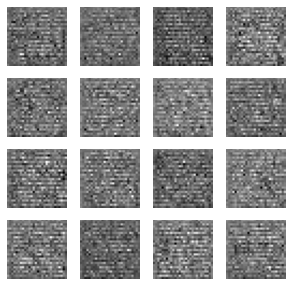

4/4 [==============================] - 0s 3ms/step
100, [D loss: 4.018811, acc.: 4.02%], [G loss: 1.486845]
1/1 [==============================] - 0s 15ms/step


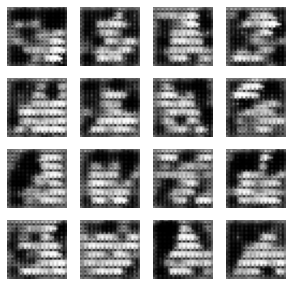

4/4 [==============================] - 0s 4ms/step
200, [D loss: 0.000704, acc.: 0.00%], [G loss: 0.032069]
1/1 [==============================] - 0s 16ms/step


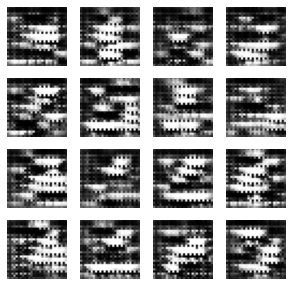

4/4 [==============================] - 0s 3ms/step
300, [D loss: 0.001525, acc.: 0.00%], [G loss: 0.121456]
1/1 [==============================] - 0s 16ms/step


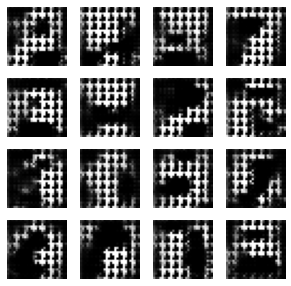

4/4 [==============================] - 0s 5ms/step
400, [D loss: 0.006649, acc.: 0.01%], [G loss: 3.743375]
1/1 [==============================] - 0s 14ms/step


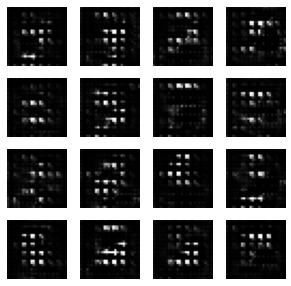

4/4 [==============================] - 0s 5ms/step
500, [D loss: 0.820565, acc.: 0.82%], [G loss: 14.530570]
1/1 [==============================] - 0s 15ms/step


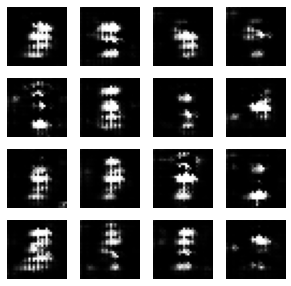

4/4 [==============================] - 0s 3ms/step
600, [D loss: 0.007567, acc.: 0.01%], [G loss: 1.724229]
1/1 [==============================] - 0s 14ms/step


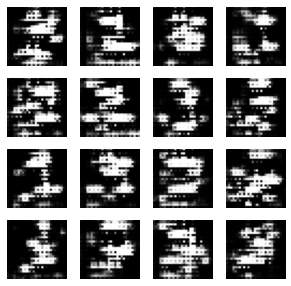

4/4 [==============================] - 0s 4ms/step
700, [D loss: 0.300239, acc.: 0.30%], [G loss: 3.831573]
1/1 [==============================] - 0s 19ms/step


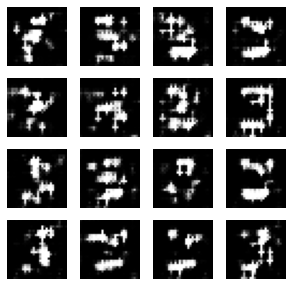

4/4 [==============================] - 0s 4ms/step
800, [D loss: 0.078905, acc.: 0.08%], [G loss: 4.647480]
1/1 [==============================] - 0s 18ms/step


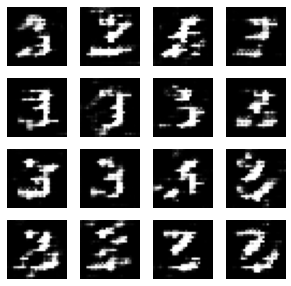

4/4 [==============================] - 0s 3ms/step
900, [D loss: 0.050001, acc.: 0.05%], [G loss: 2.746061]
1/1 [==============================] - 0s 19ms/step


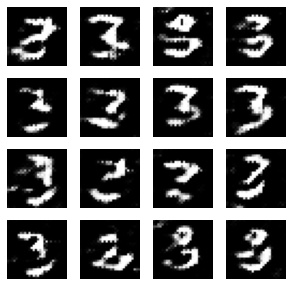

4/4 [==============================] - 0s 4ms/step
1000, [D loss: 0.361389, acc.: 0.36%], [G loss: 3.137369]
1/1 [==============================] - 0s 14ms/step


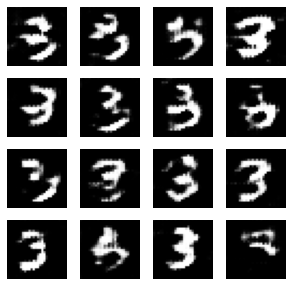

4/4 [==============================] - 0s 6ms/step
1100, [D loss: 0.096210, acc.: 0.10%], [G loss: 3.355946]
1/1 [==============================] - 0s 18ms/step


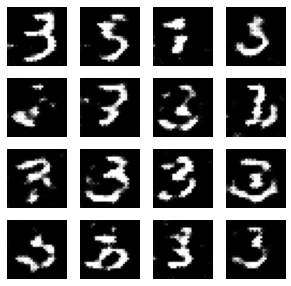

4/4 [==============================] - 0s 8ms/step
1200, [D loss: 0.219969, acc.: 0.22%], [G loss: 2.724989]
1/1 [==============================] - 0s 14ms/step


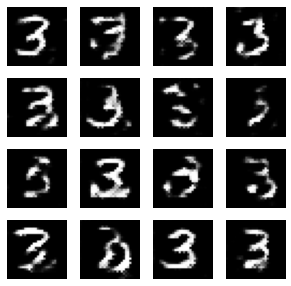

4/4 [==============================] - 0s 3ms/step
1300, [D loss: 0.192868, acc.: 0.19%], [G loss: 2.662605]
1/1 [==============================] - 0s 15ms/step


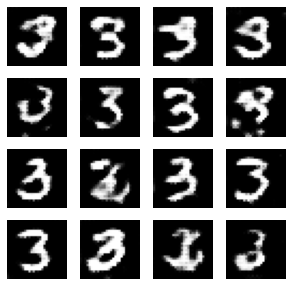

4/4 [==============================] - 0s 4ms/step
1400, [D loss: 0.216325, acc.: 0.22%], [G loss: 2.827224]
1/1 [==============================] - 0s 14ms/step


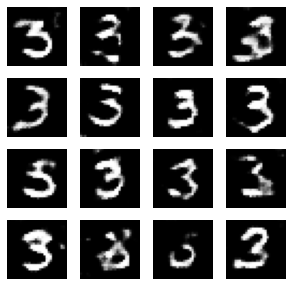

4/4 [==============================] - 0s 4ms/step
1500, [D loss: 0.380941, acc.: 0.38%], [G loss: 2.440901]
1/1 [==============================] - 0s 15ms/step


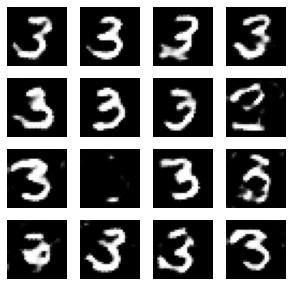

4/4 [==============================] - 0s 6ms/step
1600, [D loss: 0.235780, acc.: 0.24%], [G loss: 3.048333]
1/1 [==============================] - 0s 19ms/step


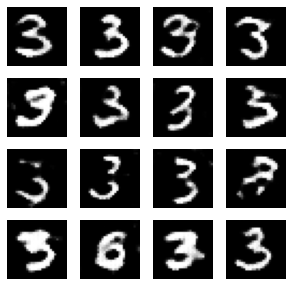

4/4 [==============================] - 0s 5ms/step
1700, [D loss: 0.164703, acc.: 0.16%], [G loss: 3.110036]
1/1 [==============================] - 0s 14ms/step


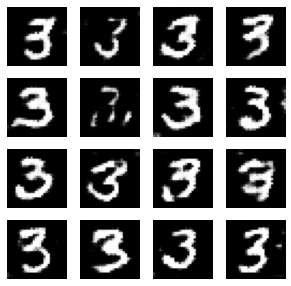

4/4 [==============================] - 0s 6ms/step
1800, [D loss: 0.278838, acc.: 0.28%], [G loss: 2.702936]
1/1 [==============================] - 0s 18ms/step


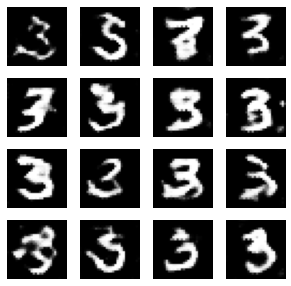

4/4 [==============================] - 0s 4ms/step
1900, [D loss: 0.153275, acc.: 0.15%], [G loss: 3.024851]
1/1 [==============================] - 0s 13ms/step


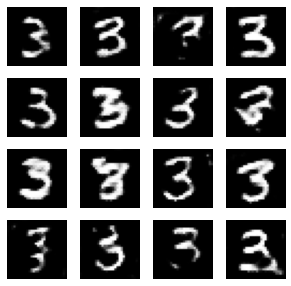

4/4 [==============================] - 0s 3ms/step
2000, [D loss: 0.534558, acc.: 0.53%], [G loss: 2.118622]
1/1 [==============================] - 0s 13ms/step


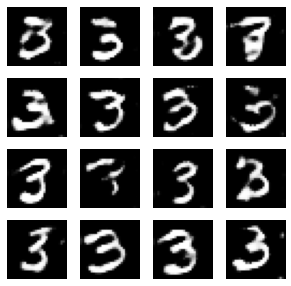

4/4 [==============================] - 0s 7ms/step
2100, [D loss: 0.392256, acc.: 0.39%], [G loss: 2.852066]
1/1 [==============================] - 0s 17ms/step


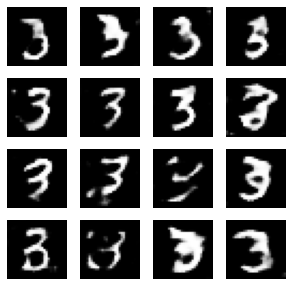

4/4 [==============================] - 0s 3ms/step
2200, [D loss: 0.330314, acc.: 0.33%], [G loss: 2.647534]
1/1 [==============================] - 0s 17ms/step


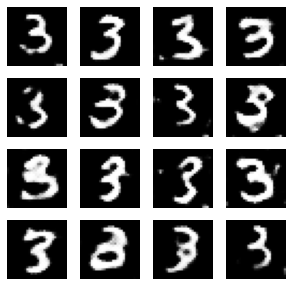

4/4 [==============================] - 0s 7ms/step
2300, [D loss: 0.128857, acc.: 0.13%], [G loss: 2.846689]
1/1 [==============================] - 0s 14ms/step


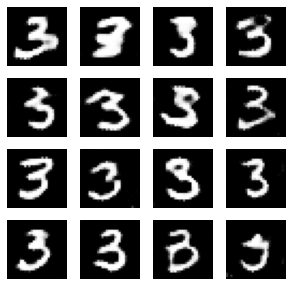

4/4 [==============================] - 0s 4ms/step
2400, [D loss: 0.248683, acc.: 0.25%], [G loss: 2.713845]
1/1 [==============================] - 0s 13ms/step


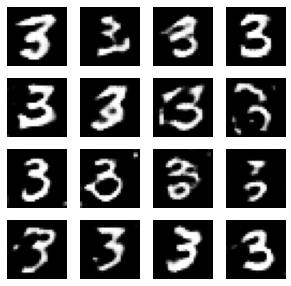

4/4 [==============================] - 0s 3ms/step
2500, [D loss: 0.153251, acc.: 0.15%], [G loss: 3.873393]
1/1 [==============================] - 0s 16ms/step


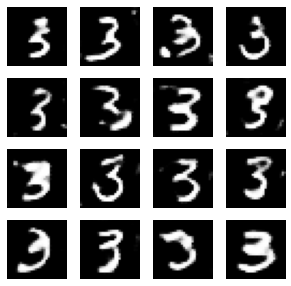

4/4 [==============================] - 0s 5ms/step
2600, [D loss: 0.510874, acc.: 0.51%], [G loss: 2.531585]
1/1 [==============================] - 0s 14ms/step


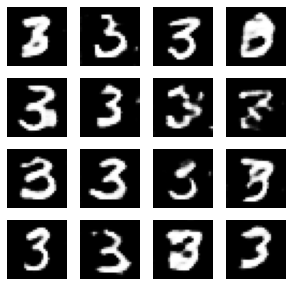

4/4 [==============================] - 0s 5ms/step
2700, [D loss: 0.405022, acc.: 0.41%], [G loss: 2.254864]
1/1 [==============================] - 0s 16ms/step


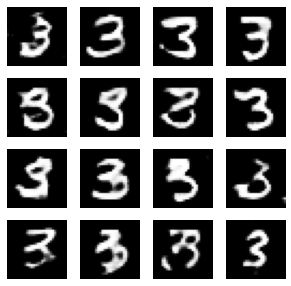

4/4 [==============================] - 0s 6ms/step
2800, [D loss: 0.433245, acc.: 0.43%], [G loss: 2.055856]
1/1 [==============================] - 0s 14ms/step


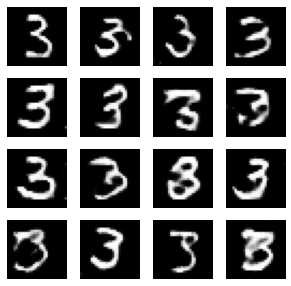

4/4 [==============================] - 0s 6ms/step
2900, [D loss: 0.519331, acc.: 0.52%], [G loss: 1.989231]
1/1 [==============================] - 0s 19ms/step


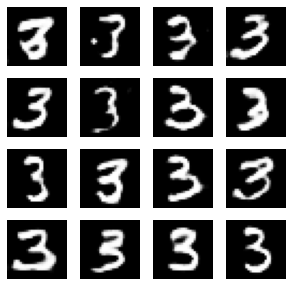

4/4 [==============================] - 0s 7ms/step
3000, [D loss: 0.470898, acc.: 0.47%], [G loss: 2.350738]
1/1 [==============================] - 0s 18ms/step


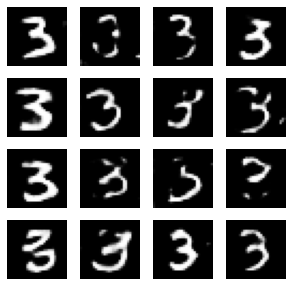

4/4 [==============================] - 0s 8ms/step
3100, [D loss: 0.451194, acc.: 0.45%], [G loss: 1.868928]
1/1 [==============================] - 0s 17ms/step


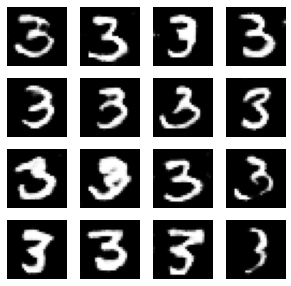

4/4 [==============================] - 0s 7ms/step
3200, [D loss: 0.370716, acc.: 0.37%], [G loss: 2.354669]
1/1 [==============================] - 0s 16ms/step


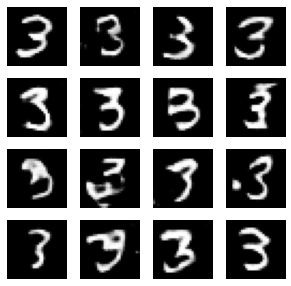

4/4 [==============================] - 0s 4ms/step
3300, [D loss: 0.422327, acc.: 0.42%], [G loss: 2.880417]
1/1 [==============================] - 0s 24ms/step


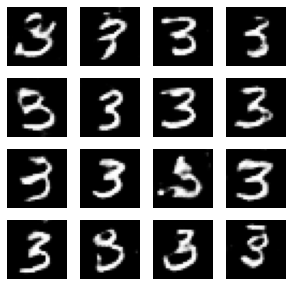

4/4 [==============================] - 0s 5ms/step
3400, [D loss: 0.289335, acc.: 0.29%], [G loss: 2.613209]
1/1 [==============================] - 0s 14ms/step


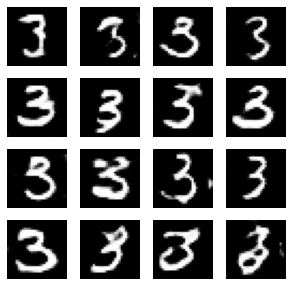

4/4 [==============================] - 0s 4ms/step
3500, [D loss: 0.297457, acc.: 0.30%], [G loss: 2.926375]
1/1 [==============================] - 0s 16ms/step


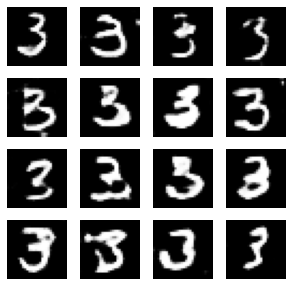

4/4 [==============================] - 0s 3ms/step
3600, [D loss: 0.334448, acc.: 0.33%], [G loss: 2.630254]
1/1 [==============================] - 0s 15ms/step


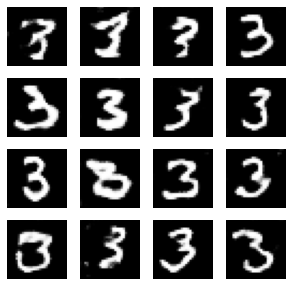

4/4 [==============================] - 0s 3ms/step
3700, [D loss: 0.218071, acc.: 0.22%], [G loss: 2.252160]
1/1 [==============================] - 0s 20ms/step


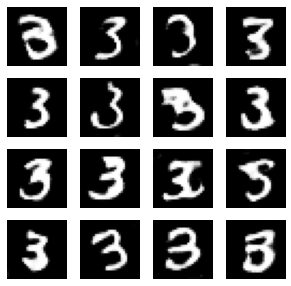

4/4 [==============================] - 0s 5ms/step
3800, [D loss: 0.379446, acc.: 0.38%], [G loss: 2.223711]
1/1 [==============================] - 0s 26ms/step


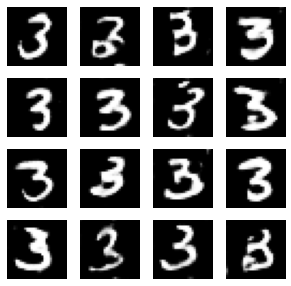

4/4 [==============================] - 0s 4ms/step
3900, [D loss: 0.376334, acc.: 0.38%], [G loss: 2.114850]
1/1 [==============================] - 0s 14ms/step


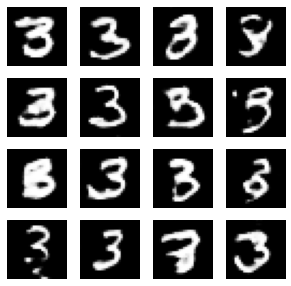

4/4 [==============================] - 0s 4ms/step
4000, [D loss: 0.446862, acc.: 0.45%], [G loss: 2.539960]
1/1 [==============================] - 0s 40ms/step


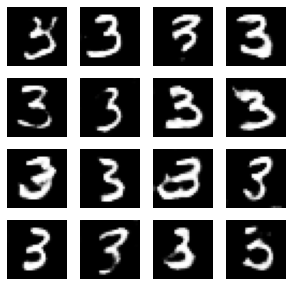

4/4 [==============================] - 0s 6ms/step
4100, [D loss: 0.320958, acc.: 0.32%], [G loss: 2.316456]
1/1 [==============================] - 0s 13ms/step


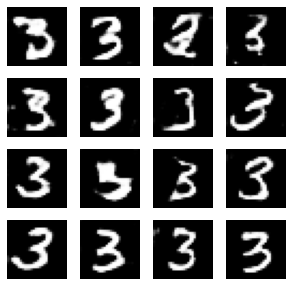

4/4 [==============================] - 0s 6ms/step
4200, [D loss: 0.350050, acc.: 0.35%], [G loss: 2.412776]
1/1 [==============================] - 0s 28ms/step


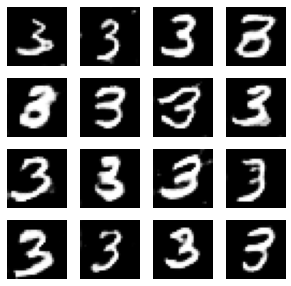

4/4 [==============================] - 0s 5ms/step
4300, [D loss: 0.374109, acc.: 0.37%], [G loss: 2.744342]
1/1 [==============================] - 0s 22ms/step


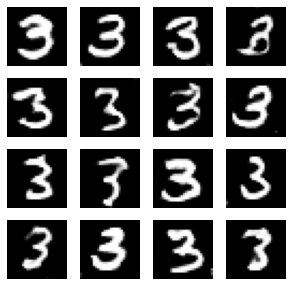

4/4 [==============================] - 0s 5ms/step
4400, [D loss: 0.511128, acc.: 0.51%], [G loss: 2.291265]
1/1 [==============================] - 0s 16ms/step


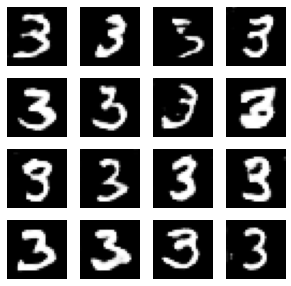

4/4 [==============================] - 0s 3ms/step
4500, [D loss: 0.382370, acc.: 0.38%], [G loss: 2.706546]
1/1 [==============================] - 0s 18ms/step


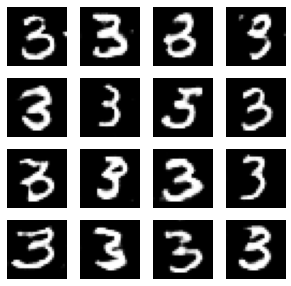

4/4 [==============================] - 0s 4ms/step
4600, [D loss: 0.386505, acc.: 0.39%], [G loss: 2.395773]
1/1 [==============================] - 0s 15ms/step


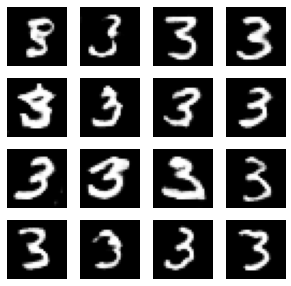

4/4 [==============================] - 0s 6ms/step
4700, [D loss: 0.359183, acc.: 0.36%], [G loss: 2.810100]
1/1 [==============================] - 0s 15ms/step


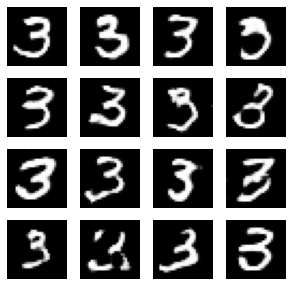

4/4 [==============================] - 0s 6ms/step
4800, [D loss: 0.479492, acc.: 0.48%], [G loss: 1.959260]
1/1 [==============================] - 0s 23ms/step


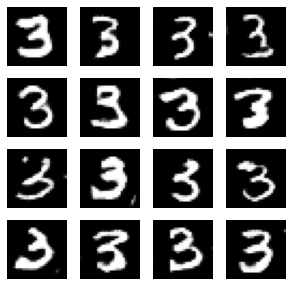

4/4 [==============================] - 0s 4ms/step
4900, [D loss: 0.394819, acc.: 0.39%], [G loss: 2.135469]
1/1 [==============================] - 0s 19ms/step


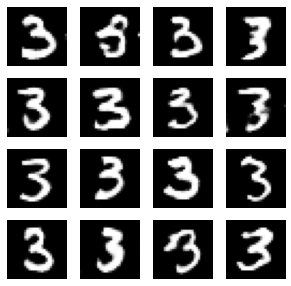

4/4 [==============================] - 0s 4ms/step
5000, [D loss: 0.435057, acc.: 0.44%], [G loss: 2.061557]
1/1 [==============================] - 0s 24ms/step


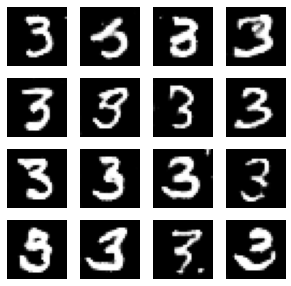

4/4 [==============================] - 0s 4ms/step
5100, [D loss: 0.485224, acc.: 0.49%], [G loss: 2.232679]
1/1 [==============================] - 0s 26ms/step


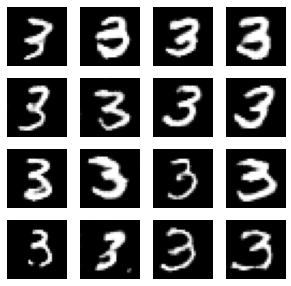

4/4 [==============================] - 0s 7ms/step
5200, [D loss: 0.370958, acc.: 0.37%], [G loss: 2.375977]
1/1 [==============================] - 0s 19ms/step


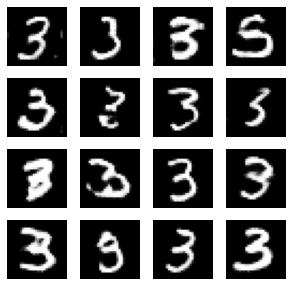

4/4 [==============================] - 0s 4ms/step
5300, [D loss: 0.260035, acc.: 0.26%], [G loss: 2.615748]
1/1 [==============================] - 0s 23ms/step


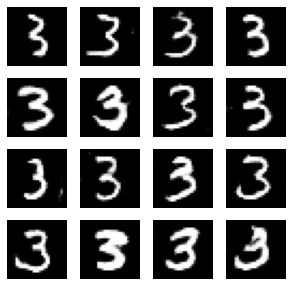

4/4 [==============================] - 0s 5ms/step
5400, [D loss: 0.382928, acc.: 0.38%], [G loss: 1.880176]
1/1 [==============================] - 0s 25ms/step


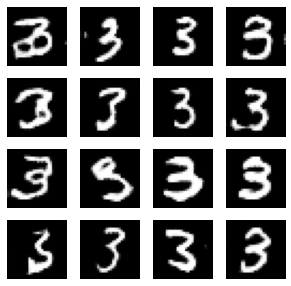

4/4 [==============================] - 0s 5ms/step
5500, [D loss: 0.319130, acc.: 0.32%], [G loss: 2.505919]
1/1 [==============================] - 0s 18ms/step


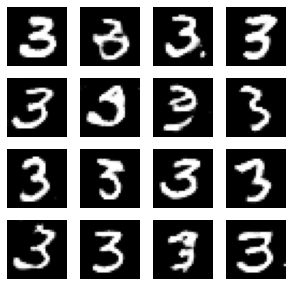

4/4 [==============================] - 0s 7ms/step
5600, [D loss: 0.323919, acc.: 0.32%], [G loss: 2.335456]
1/1 [==============================] - 0s 20ms/step


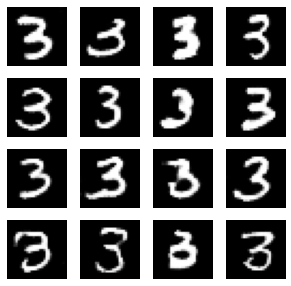

4/4 [==============================] - 0s 5ms/step
5700, [D loss: 0.300270, acc.: 0.30%], [G loss: 2.098494]
1/1 [==============================] - 0s 27ms/step


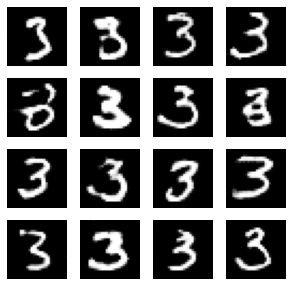

4/4 [==============================] - 0s 8ms/step
5800, [D loss: 0.318356, acc.: 0.32%], [G loss: 2.155200]
1/1 [==============================] - 0s 19ms/step


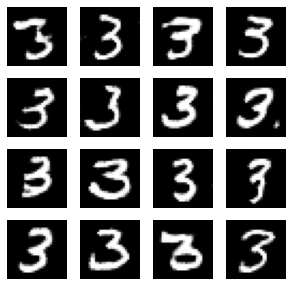

4/4 [==============================] - 0s 4ms/step
5900, [D loss: 0.314610, acc.: 0.31%], [G loss: 2.588789]
1/1 [==============================] - 0s 22ms/step


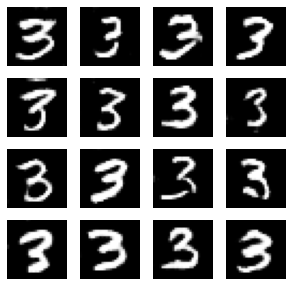

4/4 [==============================] - 0s 5ms/step
6000, [D loss: 0.316294, acc.: 0.32%], [G loss: 2.296710]
1/1 [==============================] - 0s 20ms/step


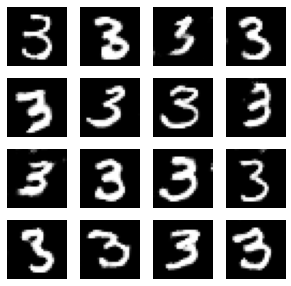

4/4 [==============================] - 0s 3ms/step
6100, [D loss: 0.306359, acc.: 0.31%], [G loss: 2.521603]
1/1 [==============================] - 0s 21ms/step


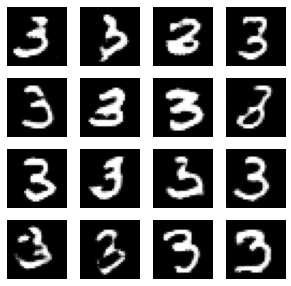

4/4 [==============================] - 0s 4ms/step
6200, [D loss: 0.345251, acc.: 0.35%], [G loss: 2.387501]
1/1 [==============================] - 0s 17ms/step


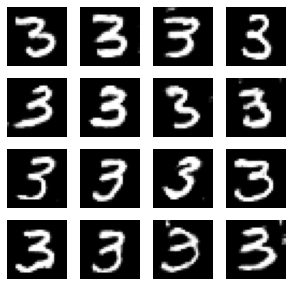

4/4 [==============================] - 0s 7ms/step
6300, [D loss: 0.287139, acc.: 0.29%], [G loss: 2.826286]
1/1 [==============================] - 0s 19ms/step


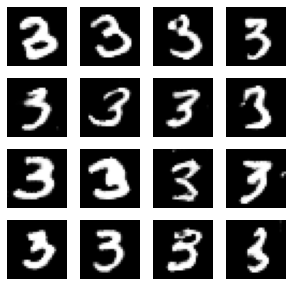

4/4 [==============================] - 0s 5ms/step
6400, [D loss: 0.336019, acc.: 0.34%], [G loss: 1.934976]
1/1 [==============================] - 0s 25ms/step


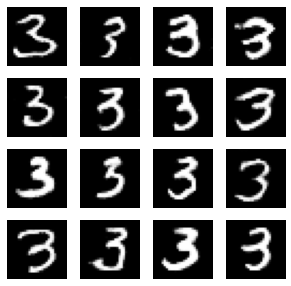

4/4 [==============================] - 0s 4ms/step
6500, [D loss: 0.310540, acc.: 0.31%], [G loss: 2.573643]
1/1 [==============================] - 0s 21ms/step


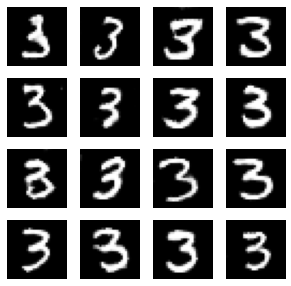

4/4 [==============================] - 0s 3ms/step
6600, [D loss: 0.444136, acc.: 0.44%], [G loss: 2.409353]
1/1 [==============================] - 0s 21ms/step


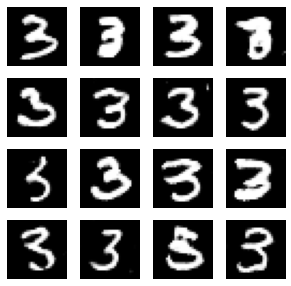

4/4 [==============================] - 0s 3ms/step
6700, [D loss: 0.186150, acc.: 0.19%], [G loss: 2.989559]
1/1 [==============================] - 0s 25ms/step


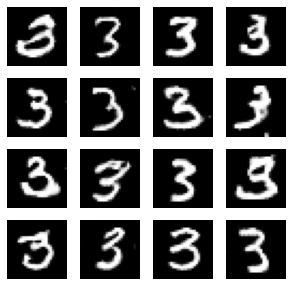

4/4 [==============================] - 0s 6ms/step
6800, [D loss: 0.279883, acc.: 0.28%], [G loss: 3.141495]
1/1 [==============================] - 0s 20ms/step


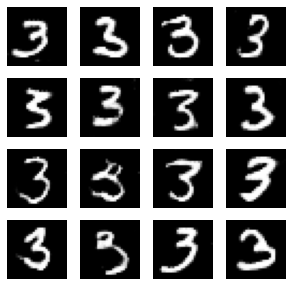

4/4 [==============================] - 0s 3ms/step
6900, [D loss: 0.271179, acc.: 0.27%], [G loss: 2.595228]
1/1 [==============================] - 0s 18ms/step


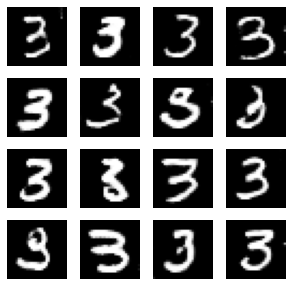

4/4 [==============================] - 0s 7ms/step
7000, [D loss: 0.274847, acc.: 0.27%], [G loss: 2.850834]
1/1 [==============================] - 0s 14ms/step


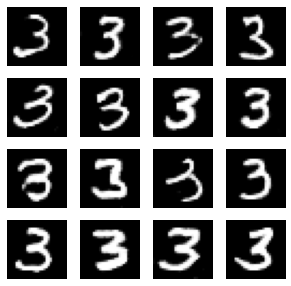

4/4 [==============================] - 0s 5ms/step
7100, [D loss: 0.247486, acc.: 0.25%], [G loss: 2.403975]
1/1 [==============================] - 0s 21ms/step


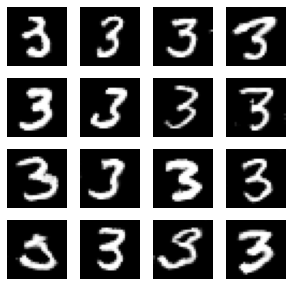

4/4 [==============================] - 0s 4ms/step
7200, [D loss: 0.236608, acc.: 0.24%], [G loss: 2.538031]
1/1 [==============================] - 0s 21ms/step


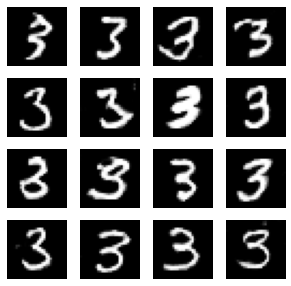

4/4 [==============================] - 0s 3ms/step
7300, [D loss: 0.354623, acc.: 0.35%], [G loss: 2.497170]
1/1 [==============================] - 0s 26ms/step


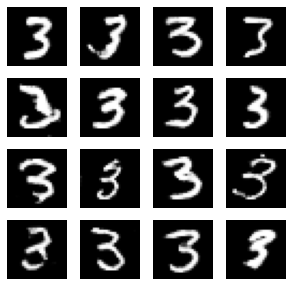

4/4 [==============================] - 0s 5ms/step
7400, [D loss: 0.310556, acc.: 0.31%], [G loss: 2.769102]
1/1 [==============================] - 0s 33ms/step


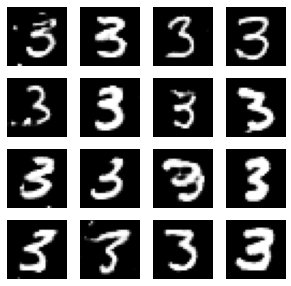

4/4 [==============================] - 0s 3ms/step
7500, [D loss: 0.337125, acc.: 0.34%], [G loss: 2.587228]
1/1 [==============================] - 0s 13ms/step


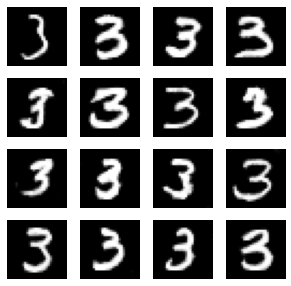

4/4 [==============================] - 0s 3ms/step
7600, [D loss: 0.316456, acc.: 0.32%], [G loss: 2.967875]
1/1 [==============================] - 0s 19ms/step


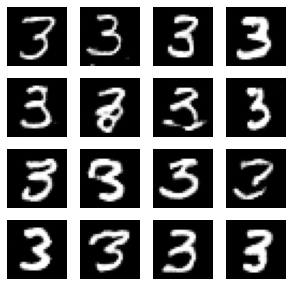

4/4 [==============================] - 0s 7ms/step
7700, [D loss: 0.432946, acc.: 0.43%], [G loss: 2.100517]
1/1 [==============================] - 0s 14ms/step


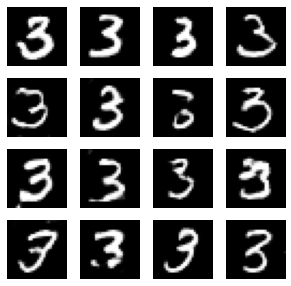

4/4 [==============================] - 0s 3ms/step
7800, [D loss: 0.500667, acc.: 0.50%], [G loss: 1.874220]
1/1 [==============================] - 0s 21ms/step


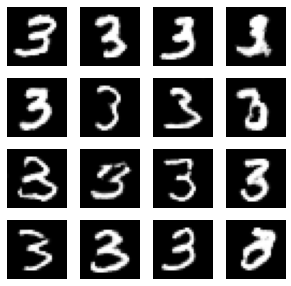

4/4 [==============================] - 0s 5ms/step
7900, [D loss: 0.311767, acc.: 0.31%], [G loss: 2.248627]
1/1 [==============================] - 0s 26ms/step


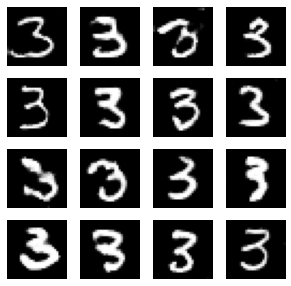

4/4 [==============================] - 0s 4ms/step
8000, [D loss: 0.274947, acc.: 0.27%], [G loss: 2.220012]
1/1 [==============================] - 0s 20ms/step


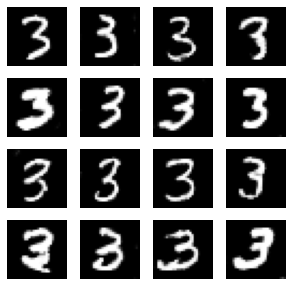

4/4 [==============================] - 0s 6ms/step
8100, [D loss: 0.386135, acc.: 0.39%], [G loss: 2.321490]
1/1 [==============================] - 0s 14ms/step


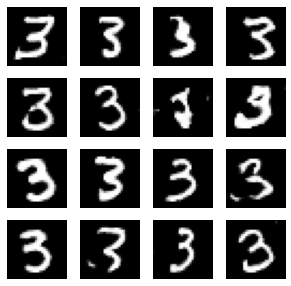

4/4 [==============================] - 0s 4ms/step
8200, [D loss: 0.349598, acc.: 0.35%], [G loss: 2.071707]
1/1 [==============================] - 0s 20ms/step


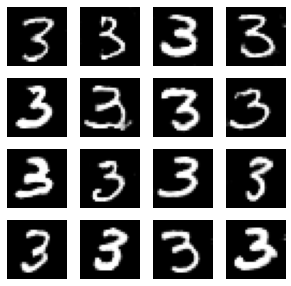

4/4 [==============================] - 0s 5ms/step
8300, [D loss: 0.330919, acc.: 0.33%], [G loss: 2.136071]
1/1 [==============================] - 0s 21ms/step


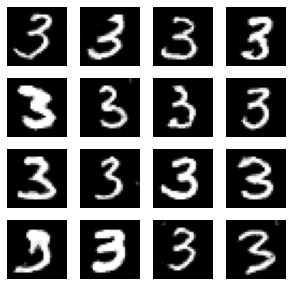

4/4 [==============================] - 0s 4ms/step
8400, [D loss: 0.301640, acc.: 0.30%], [G loss: 2.580625]
1/1 [==============================] - 0s 24ms/step


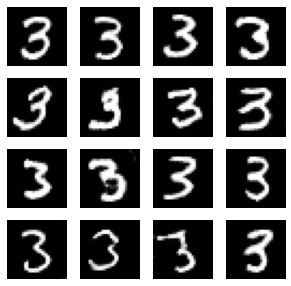

4/4 [==============================] - 0s 3ms/step
8500, [D loss: 0.320736, acc.: 0.32%], [G loss: 2.452385]
1/1 [==============================] - 0s 20ms/step


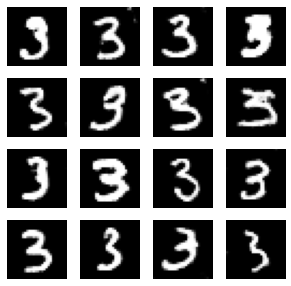

4/4 [==============================] - 0s 4ms/step
8600, [D loss: 0.283263, acc.: 0.28%], [G loss: 2.564817]
1/1 [==============================] - 0s 19ms/step


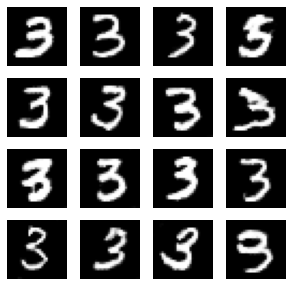

4/4 [==============================] - 0s 4ms/step
8700, [D loss: 0.283547, acc.: 0.28%], [G loss: 2.725194]
1/1 [==============================] - 0s 20ms/step


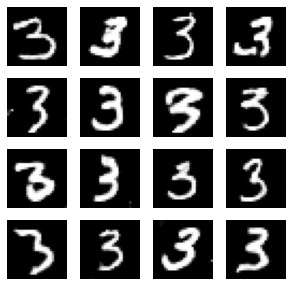

4/4 [==============================] - 0s 4ms/step
8800, [D loss: 0.319337, acc.: 0.32%], [G loss: 2.159688]
1/1 [==============================] - 0s 13ms/step


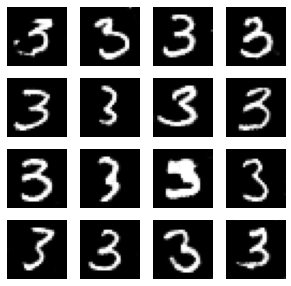

4/4 [==============================] - 0s 5ms/step
8900, [D loss: 0.205882, acc.: 0.21%], [G loss: 2.996191]
1/1 [==============================] - 0s 20ms/step


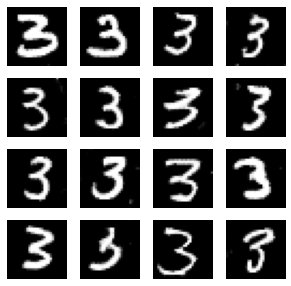

4/4 [==============================] - 0s 4ms/step
9000, [D loss: 0.357281, acc.: 0.36%], [G loss: 2.379028]
1/1 [==============================] - 0s 23ms/step


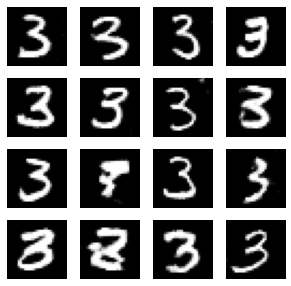

4/4 [==============================] - 0s 4ms/step
9100, [D loss: 0.255371, acc.: 0.26%], [G loss: 3.041646]
1/1 [==============================] - 0s 21ms/step


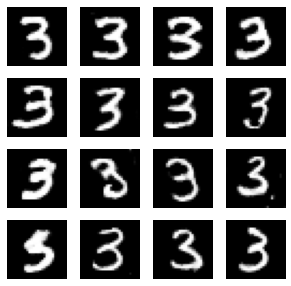

4/4 [==============================] - 0s 5ms/step
9200, [D loss: 0.317434, acc.: 0.32%], [G loss: 2.750375]
1/1 [==============================] - 0s 20ms/step


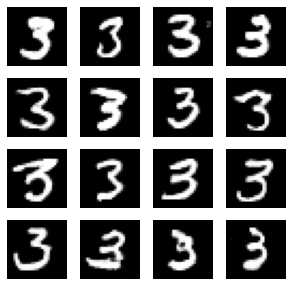

4/4 [==============================] - 0s 4ms/step
9300, [D loss: 0.331546, acc.: 0.33%], [G loss: 2.183496]
1/1 [==============================] - 0s 22ms/step


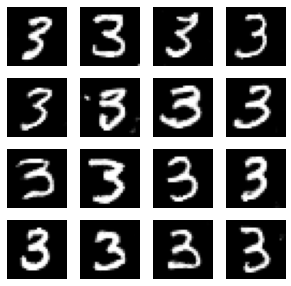

4/4 [==============================] - 0s 5ms/step
9400, [D loss: 0.175675, acc.: 0.18%], [G loss: 3.389714]
1/1 [==============================] - 0s 13ms/step


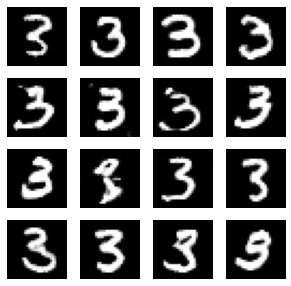

4/4 [==============================] - 0s 4ms/step
9500, [D loss: 0.332739, acc.: 0.33%], [G loss: 2.549658]
1/1 [==============================] - 0s 22ms/step


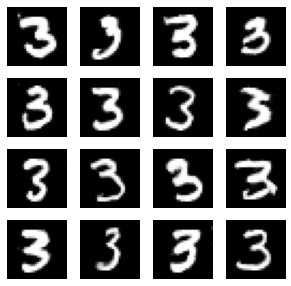

4/4 [==============================] - 0s 4ms/step
9600, [D loss: 0.312081, acc.: 0.31%], [G loss: 2.606445]
1/1 [==============================] - 0s 28ms/step


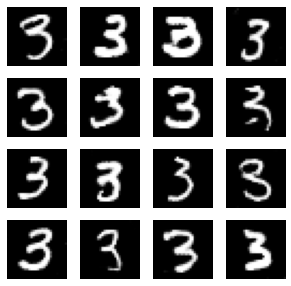

4/4 [==============================] - 0s 4ms/step
9700, [D loss: 0.382998, acc.: 0.38%], [G loss: 2.163195]
1/1 [==============================] - 0s 20ms/step


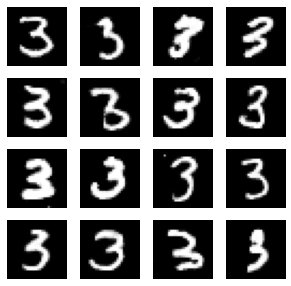

4/4 [==============================] - 0s 4ms/step
9800, [D loss: 0.280667, acc.: 0.28%], [G loss: 2.915557]
1/1 [==============================] - 0s 20ms/step


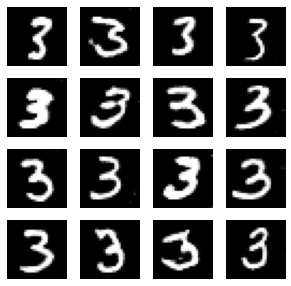

4/4 [==============================] - 0s 4ms/step
9900, [D loss: 0.399439, acc.: 0.40%], [G loss: 2.514438]
1/1 [==============================] - 0s 23ms/step


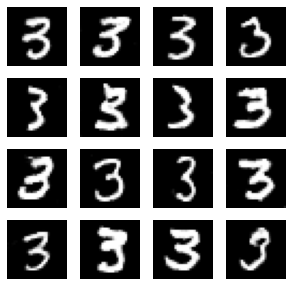

4/4 [==============================] - 0s 4ms/step
10000, [D loss: 0.247496, acc.: 0.25%], [G loss: 2.557716]
1/1 [==============================] - 0s 20ms/step


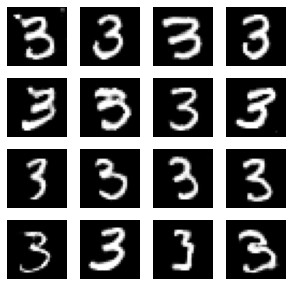

4/4 [==============================] - 0s 4ms/step
10100, [D loss: 0.377490, acc.: 0.38%], [G loss: 1.655625]
1/1 [==============================] - 0s 20ms/step


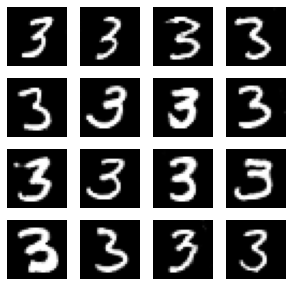

4/4 [==============================] - 0s 4ms/step
10200, [D loss: 0.321077, acc.: 0.32%], [G loss: 2.340496]
1/1 [==============================] - 0s 19ms/step


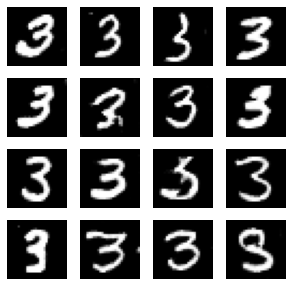

4/4 [==============================] - 0s 4ms/step
10300, [D loss: 0.283660, acc.: 0.28%], [G loss: 2.338551]
1/1 [==============================] - 0s 25ms/step


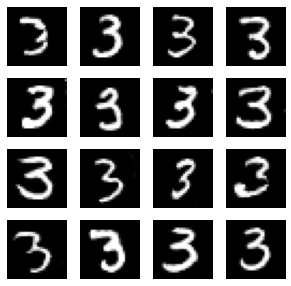

4/4 [==============================] - 0s 5ms/step
10400, [D loss: 0.347392, acc.: 0.35%], [G loss: 2.451669]
1/1 [==============================] - 0s 20ms/step


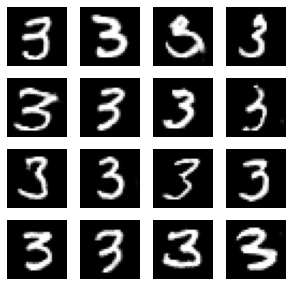

4/4 [==============================] - 0s 4ms/step
10500, [D loss: 0.252528, acc.: 0.25%], [G loss: 2.686352]
1/1 [==============================] - 0s 22ms/step


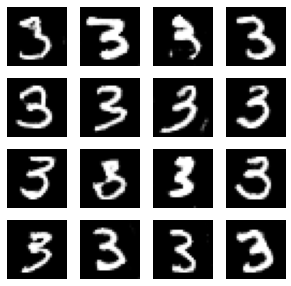

4/4 [==============================] - 0s 4ms/step
10600, [D loss: 0.398783, acc.: 0.40%], [G loss: 2.595231]
1/1 [==============================] - 0s 22ms/step


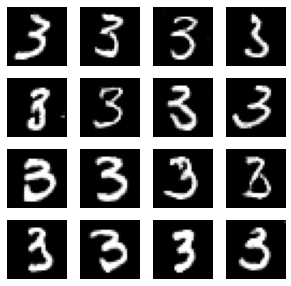

4/4 [==============================] - 0s 4ms/step
10700, [D loss: 0.222271, acc.: 0.22%], [G loss: 2.164974]
1/1 [==============================] - 0s 22ms/step


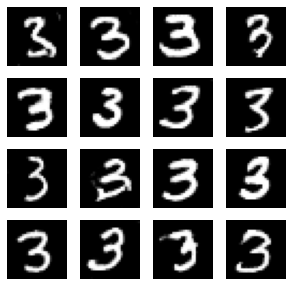

4/4 [==============================] - 0s 4ms/step
10800, [D loss: 0.368287, acc.: 0.37%], [G loss: 2.387208]
1/1 [==============================] - 0s 24ms/step


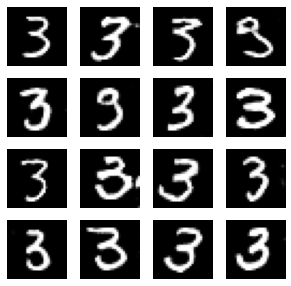

4/4 [==============================] - 0s 4ms/step
10900, [D loss: 0.270780, acc.: 0.27%], [G loss: 2.565738]
1/1 [==============================] - 0s 19ms/step


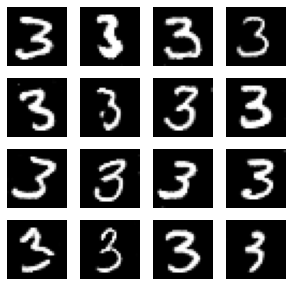

4/4 [==============================] - 0s 4ms/step
11000, [D loss: 0.317892, acc.: 0.32%], [G loss: 3.076303]
1/1 [==============================] - 0s 21ms/step


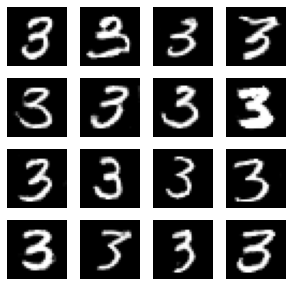

4/4 [==============================] - 0s 4ms/step
11100, [D loss: 0.291914, acc.: 0.29%], [G loss: 2.418166]
1/1 [==============================] - 0s 20ms/step


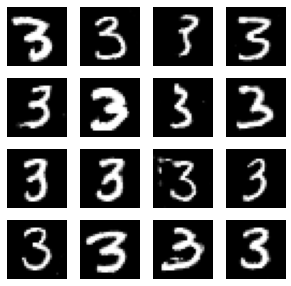

4/4 [==============================] - 0s 6ms/step
11200, [D loss: 0.272318, acc.: 0.27%], [G loss: 3.209514]
1/1 [==============================] - 0s 19ms/step


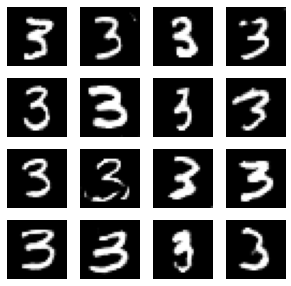

4/4 [==============================] - 0s 4ms/step
11300, [D loss: 0.233698, acc.: 0.23%], [G loss: 2.828400]
1/1 [==============================] - 0s 20ms/step


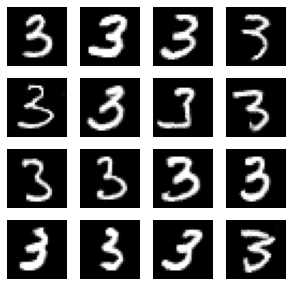

4/4 [==============================] - 0s 4ms/step
11400, [D loss: 0.302077, acc.: 0.30%], [G loss: 2.939559]
1/1 [==============================] - 0s 20ms/step


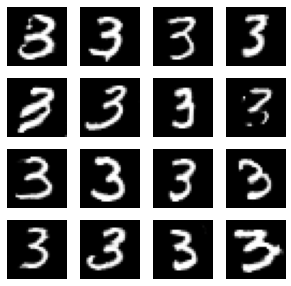

4/4 [==============================] - 0s 4ms/step
11500, [D loss: 0.321214, acc.: 0.32%], [G loss: 2.435840]
1/1 [==============================] - 0s 20ms/step


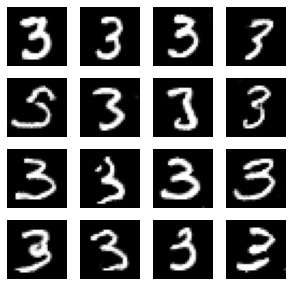

4/4 [==============================] - 0s 5ms/step
11600, [D loss: 0.420401, acc.: 0.42%], [G loss: 2.188560]
1/1 [==============================] - 0s 21ms/step


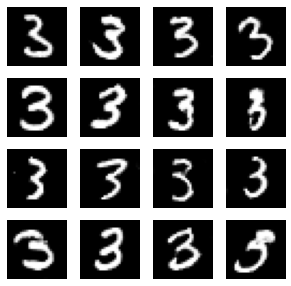

4/4 [==============================] - 0s 5ms/step
11700, [D loss: 0.347026, acc.: 0.35%], [G loss: 2.799419]
1/1 [==============================] - 0s 23ms/step


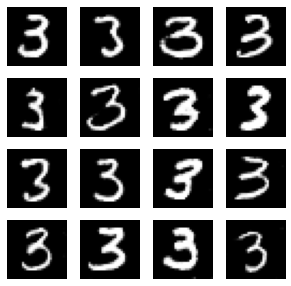

4/4 [==============================] - 0s 4ms/step
11800, [D loss: 0.388115, acc.: 0.39%], [G loss: 2.639906]
1/1 [==============================] - 0s 24ms/step


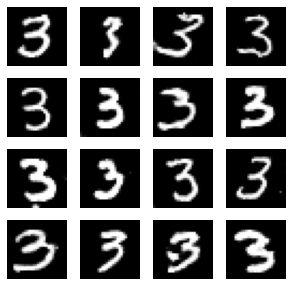

4/4 [==============================] - 0s 4ms/step
11900, [D loss: 0.314196, acc.: 0.31%], [G loss: 3.252098]
1/1 [==============================] - 0s 20ms/step


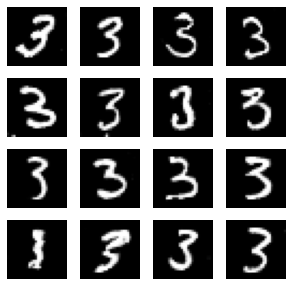

4/4 [==============================] - 0s 3ms/step
12000, [D loss: 0.337522, acc.: 0.34%], [G loss: 2.656651]
1/1 [==============================] - 0s 20ms/step


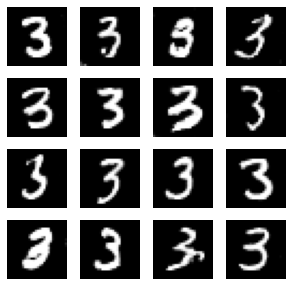

4/4 [==============================] - 0s 5ms/step
12100, [D loss: 0.336993, acc.: 0.34%], [G loss: 2.877591]
1/1 [==============================] - 0s 19ms/step


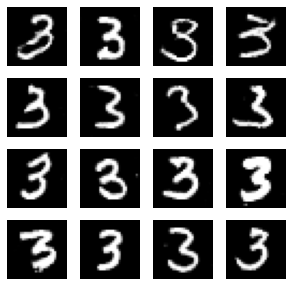

4/4 [==============================] - 0s 4ms/step
12200, [D loss: 0.324316, acc.: 0.32%], [G loss: 2.295294]
1/1 [==============================] - 0s 19ms/step


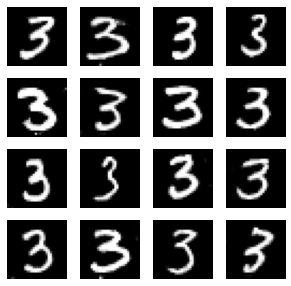

4/4 [==============================] - 0s 3ms/step
12300, [D loss: 0.317035, acc.: 0.32%], [G loss: 2.692831]
1/1 [==============================] - 0s 20ms/step


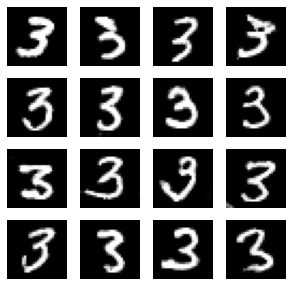

4/4 [==============================] - 0s 4ms/step
12400, [D loss: 0.331452, acc.: 0.33%], [G loss: 2.487774]
1/1 [==============================] - 0s 20ms/step


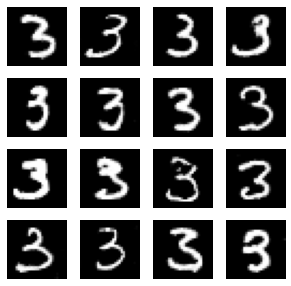

4/4 [==============================] - 0s 4ms/step
12500, [D loss: 0.328838, acc.: 0.33%], [G loss: 2.952909]
1/1 [==============================] - 0s 21ms/step


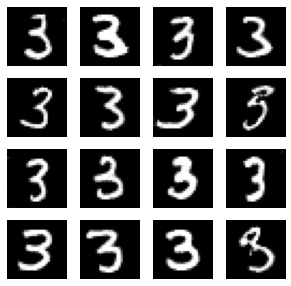

4/4 [==============================] - 0s 4ms/step
12600, [D loss: 0.259171, acc.: 0.26%], [G loss: 2.985875]
1/1 [==============================] - 0s 20ms/step


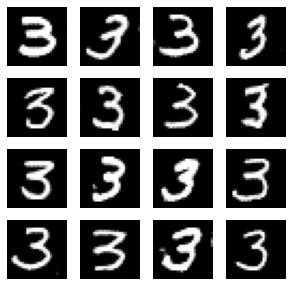

4/4 [==============================] - 0s 5ms/step
12700, [D loss: 0.231092, acc.: 0.23%], [G loss: 2.575954]
1/1 [==============================] - 0s 21ms/step


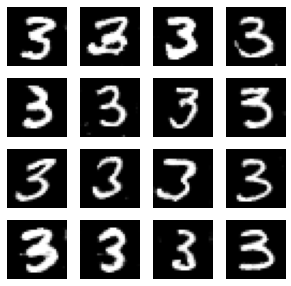

4/4 [==============================] - 0s 4ms/step
12800, [D loss: 0.248575, acc.: 0.25%], [G loss: 2.884175]
1/1 [==============================] - 0s 22ms/step


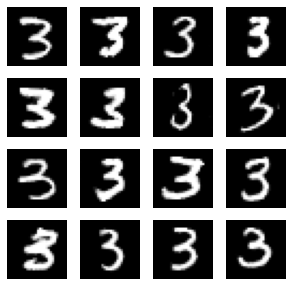

4/4 [==============================] - 0s 4ms/step
12900, [D loss: 0.258218, acc.: 0.26%], [G loss: 2.935824]
1/1 [==============================] - 0s 22ms/step


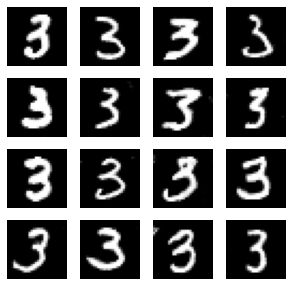

4/4 [==============================] - 0s 4ms/step
13000, [D loss: 0.322914, acc.: 0.32%], [G loss: 2.672745]
1/1 [==============================] - 0s 23ms/step


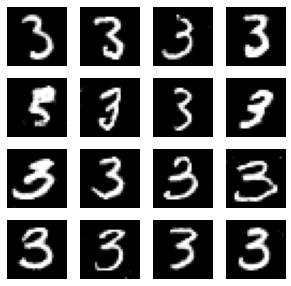

4/4 [==============================] - 0s 3ms/step
13100, [D loss: 0.333612, acc.: 0.33%], [G loss: 2.431304]
1/1 [==============================] - 0s 19ms/step


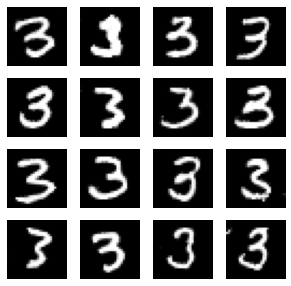

4/4 [==============================] - 0s 4ms/step
13200, [D loss: 0.283339, acc.: 0.28%], [G loss: 2.669190]
1/1 [==============================] - 0s 33ms/step


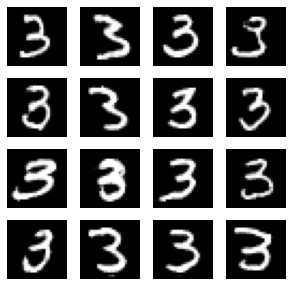

4/4 [==============================] - 0s 3ms/step
13300, [D loss: 0.262353, acc.: 0.26%], [G loss: 2.618155]
1/1 [==============================] - 0s 21ms/step


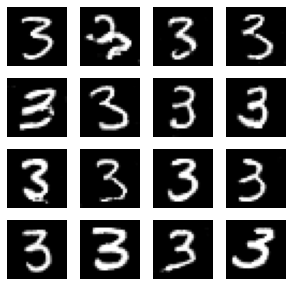

4/4 [==============================] - 0s 5ms/step
13400, [D loss: 0.287780, acc.: 0.29%], [G loss: 2.749888]
1/1 [==============================] - 0s 21ms/step


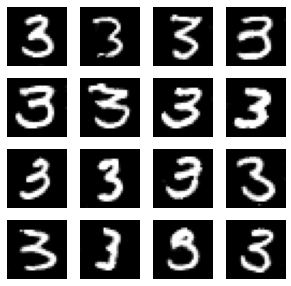

4/4 [==============================] - 0s 4ms/step
13500, [D loss: 0.317721, acc.: 0.32%], [G loss: 2.802238]
1/1 [==============================] - 0s 21ms/step


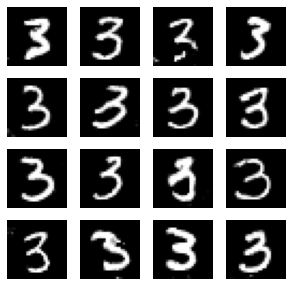

4/4 [==============================] - 0s 4ms/step
13600, [D loss: 0.361568, acc.: 0.36%], [G loss: 2.661650]
1/1 [==============================] - 0s 20ms/step


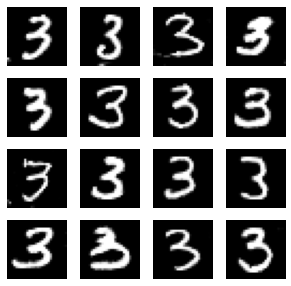

4/4 [==============================] - 0s 4ms/step
13700, [D loss: 0.238818, acc.: 0.24%], [G loss: 2.776078]
1/1 [==============================] - 0s 25ms/step


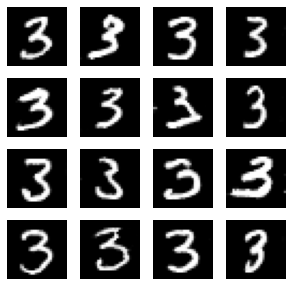

4/4 [==============================] - 0s 4ms/step
13800, [D loss: 0.384311, acc.: 0.38%], [G loss: 2.793235]
1/1 [==============================] - 0s 20ms/step


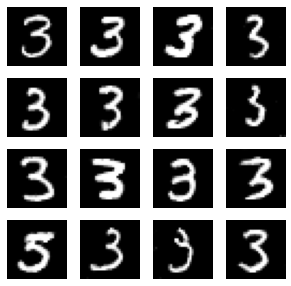

4/4 [==============================] - 0s 4ms/step
13900, [D loss: 0.265483, acc.: 0.27%], [G loss: 2.802628]
1/1 [==============================] - 0s 20ms/step


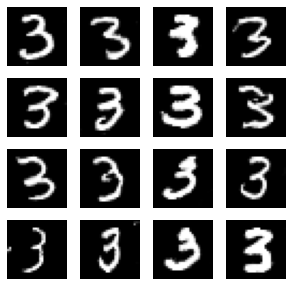

4/4 [==============================] - 0s 4ms/step
14000, [D loss: 0.268618, acc.: 0.27%], [G loss: 2.769906]
1/1 [==============================] - 0s 24ms/step


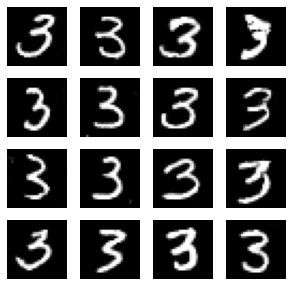

4/4 [==============================] - 0s 4ms/step
14100, [D loss: 0.267125, acc.: 0.27%], [G loss: 2.772691]
1/1 [==============================] - 0s 28ms/step


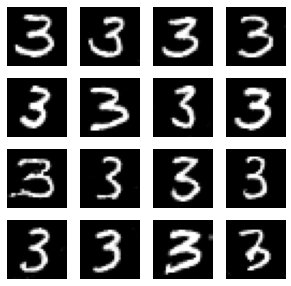

4/4 [==============================] - 0s 4ms/step
14200, [D loss: 0.300945, acc.: 0.30%], [G loss: 2.968073]
1/1 [==============================] - 0s 23ms/step


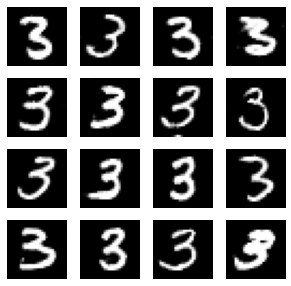

4/4 [==============================] - 0s 4ms/step
14300, [D loss: 0.267580, acc.: 0.27%], [G loss: 2.837553]
1/1 [==============================] - 0s 19ms/step


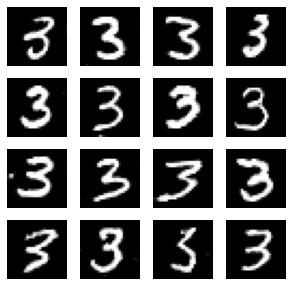

4/4 [==============================] - 0s 4ms/step
14400, [D loss: 0.302007, acc.: 0.30%], [G loss: 2.786330]
1/1 [==============================] - 0s 28ms/step


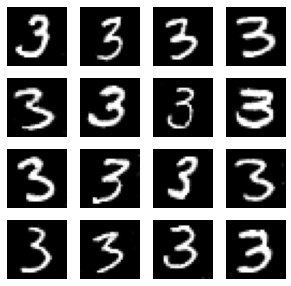

4/4 [==============================] - 0s 4ms/step
14500, [D loss: 0.231598, acc.: 0.23%], [G loss: 3.315113]
1/1 [==============================] - 0s 20ms/step


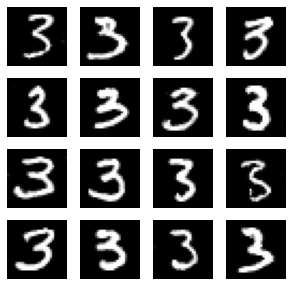

4/4 [==============================] - 0s 4ms/step
14600, [D loss: 0.360210, acc.: 0.36%], [G loss: 2.945989]
1/1 [==============================] - 0s 21ms/step


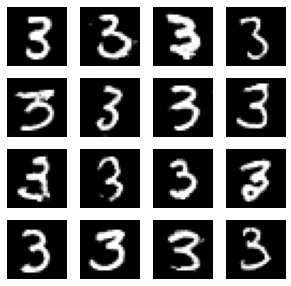

4/4 [==============================] - 0s 4ms/step
14700, [D loss: 0.186165, acc.: 0.19%], [G loss: 3.181783]
1/1 [==============================] - 0s 19ms/step


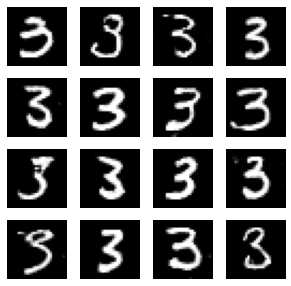

4/4 [==============================] - 0s 4ms/step
14800, [D loss: 0.262586, acc.: 0.26%], [G loss: 3.088571]
1/1 [==============================] - 0s 22ms/step


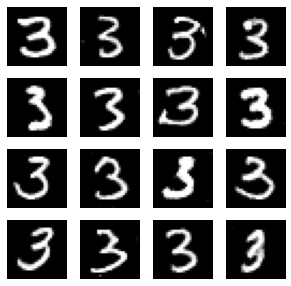

4/4 [==============================] - 0s 4ms/step
14900, [D loss: 0.231320, acc.: 0.23%], [G loss: 3.422117]
1/1 [==============================] - 0s 19ms/step


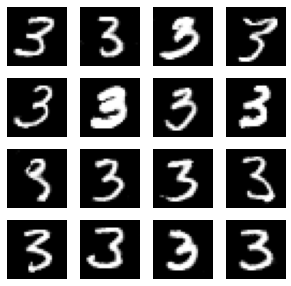

4/4 [==============================] - 0s 4ms/step
15000, [D loss: 0.271264, acc.: 0.27%], [G loss: 3.127670]
1/1 [==============================] - 0s 39ms/step


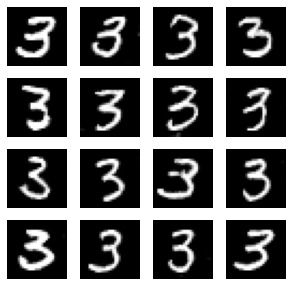

4/4 [==============================] - 0s 5ms/step
15100, [D loss: 0.197700, acc.: 0.20%], [G loss: 3.602376]
1/1 [==============================] - 0s 23ms/step


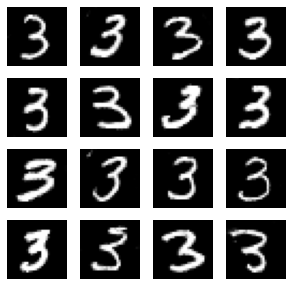

4/4 [==============================] - 0s 3ms/step
15200, [D loss: 0.268469, acc.: 0.27%], [G loss: 3.777085]
1/1 [==============================] - 0s 21ms/step


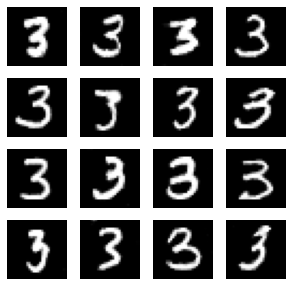

4/4 [==============================] - 0s 4ms/step
15300, [D loss: 0.223603, acc.: 0.22%], [G loss: 3.007329]
1/1 [==============================] - 0s 20ms/step


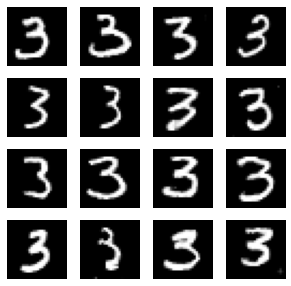

4/4 [==============================] - 0s 4ms/step
15400, [D loss: 0.215679, acc.: 0.22%], [G loss: 3.244339]
1/1 [==============================] - 0s 24ms/step


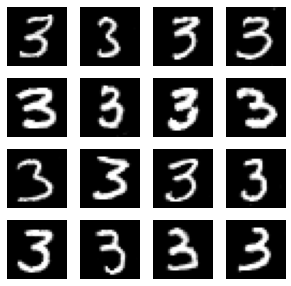

4/4 [==============================] - 0s 5ms/step
15500, [D loss: 0.252316, acc.: 0.25%], [G loss: 3.247103]
1/1 [==============================] - 0s 22ms/step


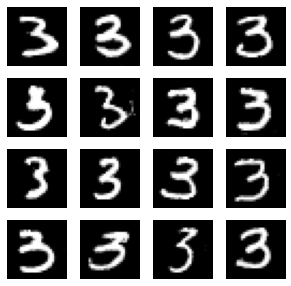

4/4 [==============================] - 0s 3ms/step
15600, [D loss: 0.291285, acc.: 0.29%], [G loss: 2.784047]
1/1 [==============================] - 0s 22ms/step


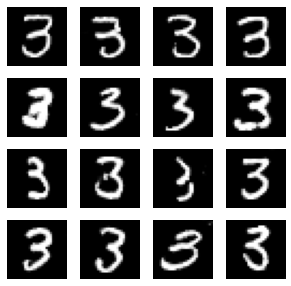

4/4 [==============================] - 0s 4ms/step
15700, [D loss: 0.258977, acc.: 0.26%], [G loss: 3.958004]
1/1 [==============================] - 0s 31ms/step


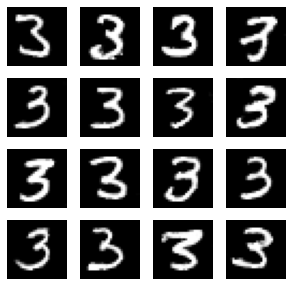

4/4 [==============================] - 0s 4ms/step
15800, [D loss: 0.253616, acc.: 0.25%], [G loss: 3.786731]
1/1 [==============================] - 0s 21ms/step


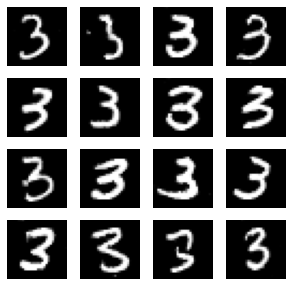

4/4 [==============================] - 0s 4ms/step
15900, [D loss: 0.189146, acc.: 0.19%], [G loss: 3.761682]
1/1 [==============================] - 0s 24ms/step


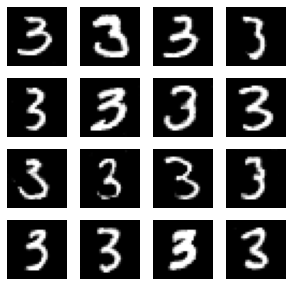

4/4 [==============================] - 0s 4ms/step
16000, [D loss: 0.275492, acc.: 0.28%], [G loss: 2.910229]
1/1 [==============================] - 0s 25ms/step


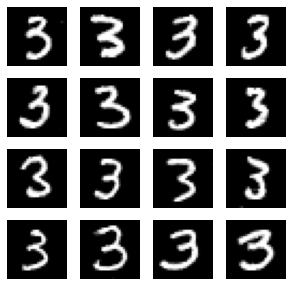

4/4 [==============================] - 0s 6ms/step
16100, [D loss: 0.272203, acc.: 0.27%], [G loss: 3.689905]
1/1 [==============================] - 0s 33ms/step


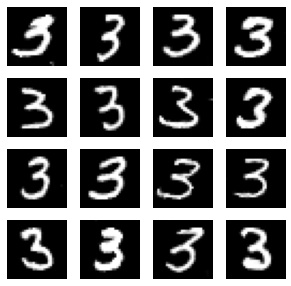

4/4 [==============================] - 0s 3ms/step
16200, [D loss: 0.257646, acc.: 0.26%], [G loss: 3.350343]
1/1 [==============================] - 0s 20ms/step


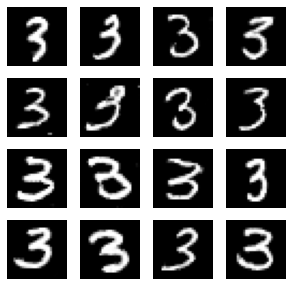

4/4 [==============================] - 0s 4ms/step
16300, [D loss: 0.260967, acc.: 0.26%], [G loss: 3.380618]
1/1 [==============================] - 0s 20ms/step


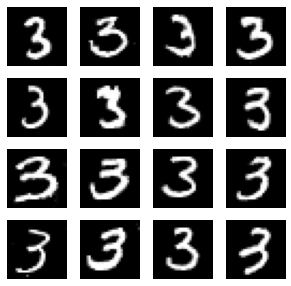

4/4 [==============================] - 0s 5ms/step
16400, [D loss: 0.232160, acc.: 0.23%], [G loss: 3.429567]
1/1 [==============================] - 0s 19ms/step


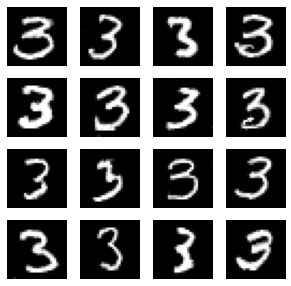

4/4 [==============================] - 0s 3ms/step
16500, [D loss: 0.206145, acc.: 0.21%], [G loss: 3.429181]
1/1 [==============================] - 0s 21ms/step


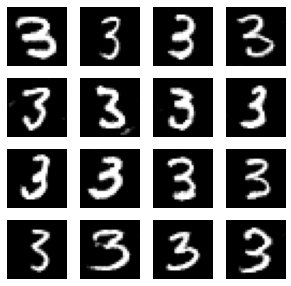

4/4 [==============================] - 0s 4ms/step
16600, [D loss: 0.198713, acc.: 0.20%], [G loss: 3.245263]
1/1 [==============================] - 0s 21ms/step


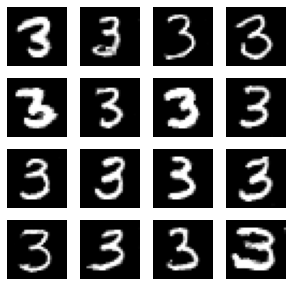

4/4 [==============================] - 0s 5ms/step
16700, [D loss: 0.224256, acc.: 0.22%], [G loss: 3.620554]
1/1 [==============================] - 0s 34ms/step


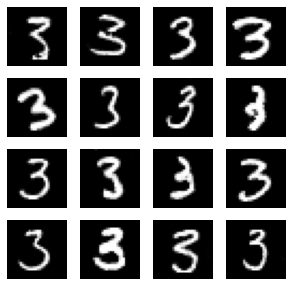

4/4 [==============================] - 0s 4ms/step
16800, [D loss: 0.193435, acc.: 0.19%], [G loss: 3.347783]
1/1 [==============================] - 0s 21ms/step


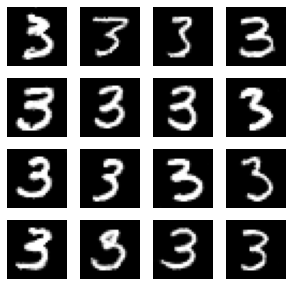

4/4 [==============================] - 0s 4ms/step
16900, [D loss: 0.228912, acc.: 0.23%], [G loss: 3.162619]
1/1 [==============================] - 0s 19ms/step


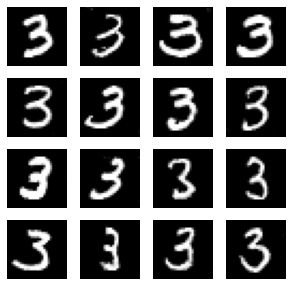

4/4 [==============================] - 0s 4ms/step
17000, [D loss: 0.295960, acc.: 0.30%], [G loss: 3.365623]
1/1 [==============================] - 0s 26ms/step


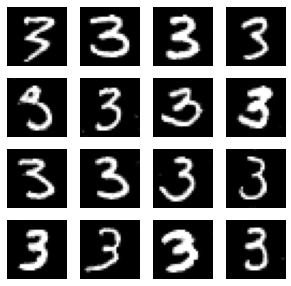

4/4 [==============================] - 0s 4ms/step
17100, [D loss: 0.195136, acc.: 0.20%], [G loss: 3.571969]
1/1 [==============================] - 0s 22ms/step


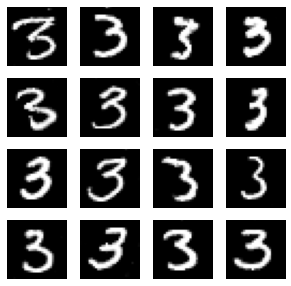

4/4 [==============================] - 0s 4ms/step
17200, [D loss: 0.230240, acc.: 0.23%], [G loss: 3.890850]
1/1 [==============================] - 0s 38ms/step


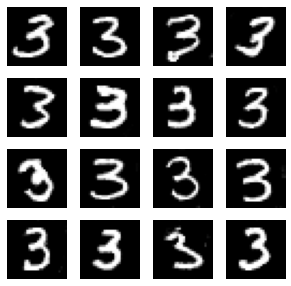

4/4 [==============================] - 0s 3ms/step
17300, [D loss: 0.183707, acc.: 0.18%], [G loss: 4.227075]
1/1 [==============================] - 0s 22ms/step


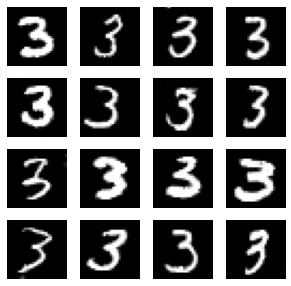

4/4 [==============================] - 0s 5ms/step
17400, [D loss: 0.299252, acc.: 0.30%], [G loss: 3.561434]
1/1 [==============================] - 0s 20ms/step


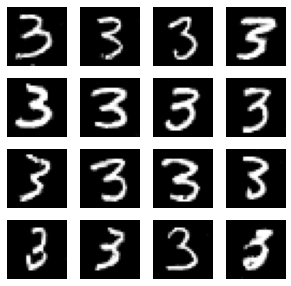

4/4 [==============================] - 0s 5ms/step
17500, [D loss: 0.192420, acc.: 0.19%], [G loss: 3.476813]
1/1 [==============================] - 0s 20ms/step


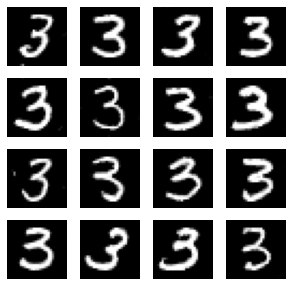

4/4 [==============================] - 0s 4ms/step
17600, [D loss: 0.189921, acc.: 0.19%], [G loss: 3.172985]
1/1 [==============================] - 0s 23ms/step


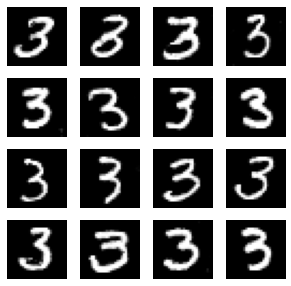

4/4 [==============================] - 0s 4ms/step
17700, [D loss: 0.210768, acc.: 0.21%], [G loss: 3.137040]
1/1 [==============================] - 0s 29ms/step


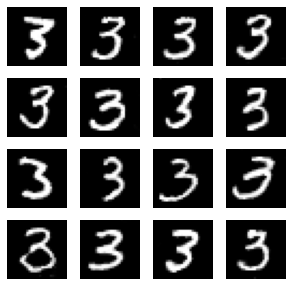

4/4 [==============================] - 0s 7ms/step
17800, [D loss: 0.186729, acc.: 0.19%], [G loss: 4.243282]
1/1 [==============================] - 0s 19ms/step


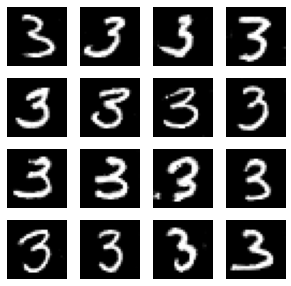

4/4 [==============================] - 0s 4ms/step
17900, [D loss: 0.190650, acc.: 0.19%], [G loss: 4.088723]
1/1 [==============================] - 0s 23ms/step


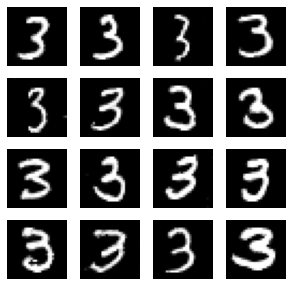

4/4 [==============================] - 0s 4ms/step
18000, [D loss: 0.180751, acc.: 0.18%], [G loss: 3.532026]
1/1 [==============================] - 0s 21ms/step


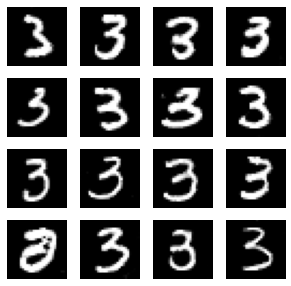

4/4 [==============================] - 0s 4ms/step
18100, [D loss: 0.156689, acc.: 0.16%], [G loss: 3.791540]
1/1 [==============================] - 0s 20ms/step


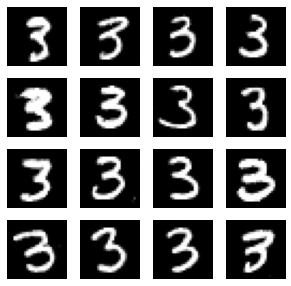

4/4 [==============================] - 0s 4ms/step


KeyboardInterrupt: ignored

In [8]:
for epoch in range(epochs):
    idx = np.random.randint(0,x_train.shape[0],batch_size) #0~6사이의 인트값을 랜덤하게 뽑는다
    real_imgs = x_train[idx]

    z = np.random.normal(0,1,(batch_size, noise))
    fake_imgs = generator.predict(z)

    d_hist_real = discriminator.train_on_batch(real_imgs, real) #이것만 학습하고 끝남(1 epoch)
    d_hist_fake = discriminator.train_on_batch(fake_imgs, fake)

    d_loss, d_acc = np.add(d_hist_fake, d_hist_real)*0.5 #평균값


    if epoch %2 == 0:
        z = np.random.normal(0,1,(batch_size, noise))
        gan_hist = gan_model.train_on_batch(z, real) #1이라고 답하게 학습 (generator만 학습됨)

    if epoch % sample_interval == 0: #100에폭마다 한번씩
        print('%d, [D loss: %f, acc.: %.2f%%], [G loss: %f]'
              %(epoch, d_loss, d_loss, gan_hist))
        row = col = 4
        z = np.random.normal(0,1,(row*col, noise))
        fake_imgs = generator.predict(z)
        fake_imgs = 0.5*fake_imgs + 0.5
        _, axs = plt.subplots(row, col, figsize=(5,5),sharey=True, sharex=True)
        cont = 0
        for i in range(row):
            for j in range(col):
                axs[i,j].imshow(fake_imgs[cont, :, :, 0], cmap='gray')
                axs[i,j].axis('off')
                cont += 1
        path = os.path.join(OUT_DIR, 'img-{}'.format(epoch+1))
        plt.show()
        plt.close()
        generator.save('/content/drive/MyDrive/GAN_MODELS/generator_mnist_{}.h5'.format(MY_NUMBER))

In [12]:
number_GAN_MODELS = []
for i in range(10):
  number_GAN_MODELS.append(load_model(
      '/content/drive/MyDrive/GAN_MODELS/generator_mnist_{}.h5'.format(i)))

In [23]:
four_digit_number = '3951' #1234 출력 

In [24]:
imgs = []
for i in four_digit_number:
  i = int(i)
  z = np.random.normal(0,1,(1,100))
  fake_img = number_GAN_MODELS[i].predict(z)
  fake_img = 0.5 * fake_img + 0.5
  print(fake_img.shape)
  imgs.append(fake_img.reshape(28,28))

1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 92ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 99ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 16ms/step
(1, 28, 28, 1)


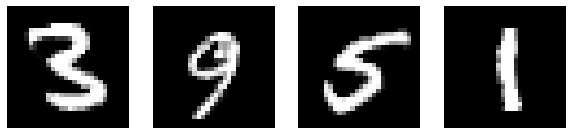

In [25]:
_, axs = plt.subplots(1,4,figsize=(10,40), sharex = True, sharey = True)
for i in range(4):
  axs[i].imshow(imgs[i], cmap = 'gray')
  axs[i].axis('off')
plt.show() #mnist 없는 수 생성해낸 것

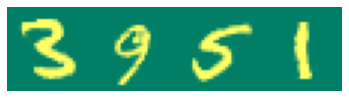

In [27]:
img = imgs[0]
for i in range(1,4):
  img = np.append(img,imgs[i], axis=1)
plt.summer()
plt.imshow(img)
plt.axis('off') #xy축 눈금 없애기
plt.show()

12345678910
1/1 [==============================] - 0s 14ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 14ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 13ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 102ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 13ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 13ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 97ms/step
(1, 28, 28, 1)


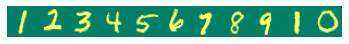

In [31]:
input_value = input()
imgs = []
for i in input_value:
    i = int(i)
    z = np.random.normal(0,1,(1,100))
    fake_img = number_GAN_MODELS[i].predict(z)
    fake_img = 0.5 * fake_img + 0.5
    print(fake_img.shape)
    imgs.append(fake_img.reshape(28,28))
img = imgs[0]
for i in range(1,len(input_value)):
    img = np.append(img,imgs[i], axis=1)
plt.summer()
plt.imshow(img)
plt.axis('off') #xy축 눈금 없애기
plt.show() 